# Image Classification Exercises

#### I wanted to get more experience with image classification and tensorflow. The first section uses the Intel Image Classification dataset from kaggle (https://www.kaggle.com/puneet6060/intel-image-classification) and follows one of the top notebooks on training and testing a classifier to distinguish the six categories of images: glacier, sea, buildings, forest, street, and mountain.

#### The following section loads a different dataset: a set of images scraped from google image search using four sets of search terms: architecture, art and culture, food and drinks, and travel and adventure. Since this set of images wasn't "curated" by a person, but simply results from search engine output, the classes aren't as well defined, so we shouldn't expect the classifying algorithm to do as well. Also, we will employ "transfer learning" in this section.

In [28]:
import tensorflow.keras.layers as Layers
import tensorflow.keras.activations as Actications
import tensorflow.keras.models as Models
import tensorflow.keras.optimizers as Optimizer
import tensorflow.keras.metrics as Metrics
import tensorflow.keras.utils as Utils
from tensorflow import keras
from keras.utils.vis_utils import model_to_dot
import pydotplus as pydot

import os
import matplotlib.pyplot as plot
import cv2
import numpy as np
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix as CM
from random import randint
from IPython.display import SVG
import matplotlib.gridspec as gridspec

### Setting functions to read the image data using openCV, and function to return class label name

In [20]:
def get_images(directory):
    Images = []
    Labels = []  # 0 for Building , 1 for forest, 2 for glacier, 3 for mountain, 4 for Sea , 5 for Street
    label = 0
    
    for labels in os.listdir(directory): #Main Directory where each class label is present as folder name.
        if labels == 'glacier': #Folder contain Glacier Images get the '2' class label.
            label = 2
        elif labels == 'sea':
            label = 4
        elif labels == 'buildings':
            label = 0
        elif labels == 'forest':
            label = 1
        elif labels == 'street':
            label = 5
        elif labels == 'mountain':
            label = 3
        
        for image_file in os.listdir(directory+labels): #Extracting the file name of the image from Class Label folder
            image = cv2.imread(directory+labels+r'/'+image_file) #Reading the image (OpenCV)
            image = cv2.resize(image,(150,150)) #Resize the image, Some images are different sizes. (Resizing is very Important)
            Images.append(image)
            Labels.append(label)
    
    return shuffle(Images,Labels,random_state=817328462) #Shuffle the dataset you just prepared.

def get_classlabel(class_code):
    labels = {2:'glacier', 4:'sea', 0:'buildings', 1:'forest', 5:'street', 3:'mountain'}
    
    return labels[class_code]


In [21]:
Images, Labels = get_images('archive/seg_train/seg_train/') #Extract the training images from the folders.

Images = np.array(Images) #converting the list of images to numpy array.
Labels = np.array(Labels)

In [22]:
print("Shape of Images:",Images.shape)
print("Shape of Labels:",Labels.shape)

Shape of Images: (14034, 150, 150, 3)
Shape of Labels: (14034,)


### Plot a selection of images with their labels to get an idea of what is being classified

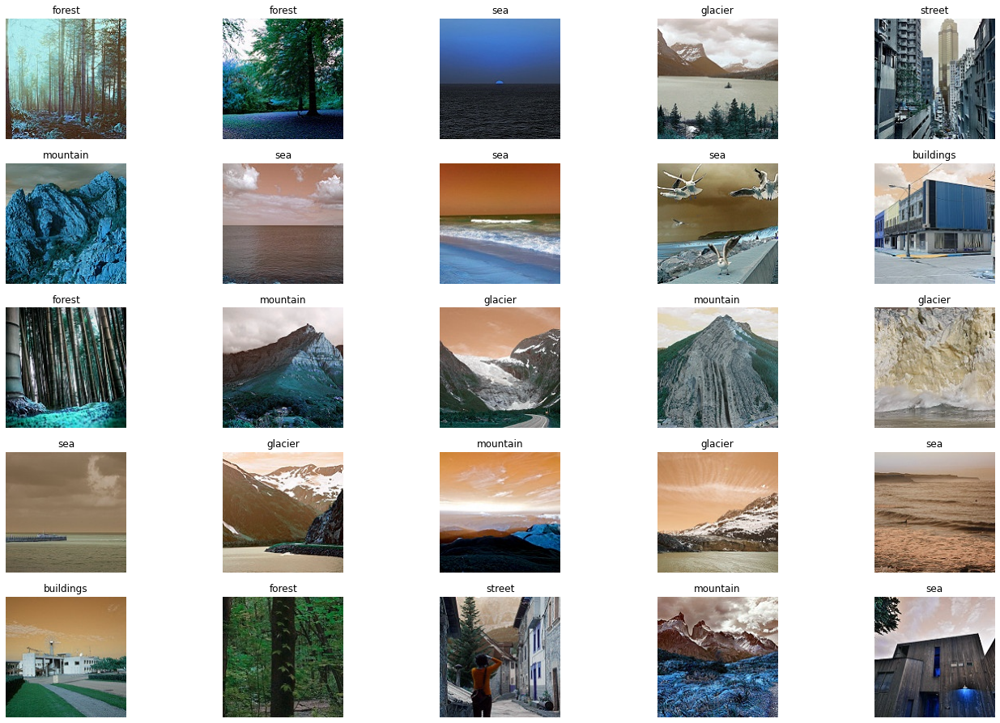

In [23]:
f,ax = plot.subplots(5,5) 
f.subplots_adjust(0,0,3,3)
for i in range(0,5,1):
    for j in range(0,5,1):
        rnd_number = randint(0,len(Images))
        ax[i,j].imshow(Images[rnd_number])
        ax[i,j].set_title(get_classlabel(Labels[rnd_number]))
        ax[i,j].axis('off')

### Creating the layers of a standard CNN model

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_30 (Conv2D)           (None, 148, 148, 200)     5600      
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 146, 146, 180)     324180    
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 29, 29, 180)       0         
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 27, 27, 180)       291780    
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 25, 25, 140)       226940    
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 23, 23, 100)       126100    
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 21, 21, 50)       

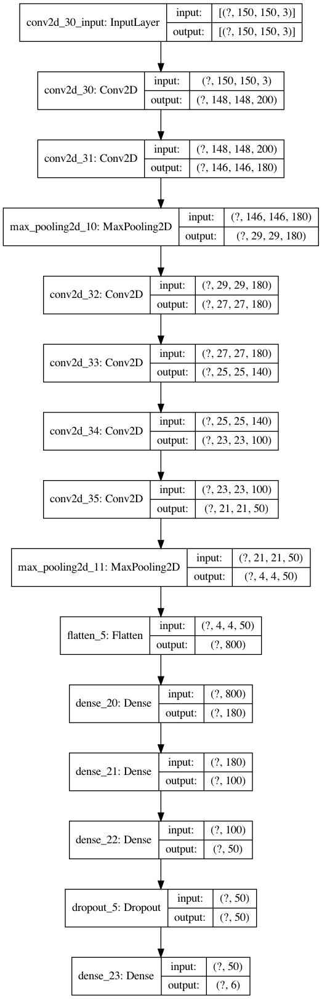

In [24]:
model = Models.Sequential()

model.add(Layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(150,150,3)))
model.add(Layers.Conv2D(180,kernel_size=(3,3),activation='relu'))
model.add(Layers.MaxPool2D(5,5))
model.add(Layers.Conv2D(180,kernel_size=(3,3),activation='relu'))
model.add(Layers.Conv2D(140,kernel_size=(3,3),activation='relu'))
model.add(Layers.Conv2D(100,kernel_size=(3,3),activation='relu'))
model.add(Layers.Conv2D(50,kernel_size=(3,3),activation='relu'))
model.add(Layers.MaxPool2D(5,5))
model.add(Layers.Flatten())
model.add(Layers.Dense(180,activation='relu'))
model.add(Layers.Dense(100,activation='relu'))
model.add(Layers.Dense(50,activation='relu'))
model.add(Layers.Dropout(rate=0.5))
model.add(Layers.Dense(6,activation='softmax'))

model.compile(optimizer=Optimizer.Adam(lr=0.0001),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

model.summary()
SVG(model_to_dot(model).create(prog='dot', format='svg'))
Utils.plot_model(model,to_file='model.png',show_shapes=True)

### Training and Evaluating the model

In [26]:
# trained = model.fit(Images,Labels,epochs=35,validation_split=0.30)

### This step takes way to long on my macbook,
### so I trained this on a kaggle kernel.
### Then I save the 'trained' data and the model,
### downloaded them and open them below

In [174]:
model = keras.models.load_model("kaggle_trained_model")

import pandas as pd

history = pd.read_csv('history.csv')

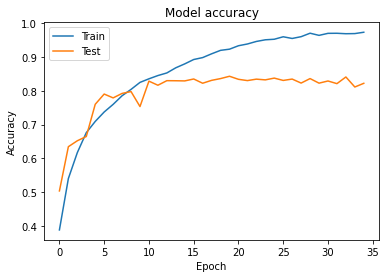

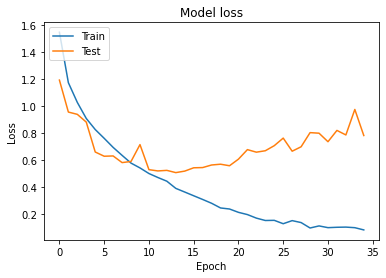

In [175]:
plot.plot(history['acc'])
plot.plot(history['val_acc'])
plot.title('Model accuracy')
plot.ylabel('Accuracy')
plot.xlabel('Epoch')
plot.legend(['Train', 'Test'], loc='upper left')
plot.show()

plot.plot(history['loss'])
plot.plot(history['val_loss'])
plot.title('Model loss')
plot.ylabel('Loss')
plot.xlabel('Epoch')
plot.legend(['Train', 'Test'], loc='upper left')
plot.show()

In [178]:
test_images,test_labels = get_images('archive/seg_test/seg_test/')
test_images = np.array(test_images)
test_labels = np.array(test_labels)
model.evaluate(test_images,test_labels, verbose=1)

94/94 [==============================] - 431s 5s/step - loss: 0.7676 - accuracy: 0.1390


[0.7675502300262451, 0.13899999856948853]

In [58]:
model.evaluate(test_images[:5],test_labels[:5], verbose=1, batch_size=1, steps=1)

1/1 [==============================] - 0s 1ms/step - loss: 1.8821e-04 - accuracy: 0.0000e+00


[0.00018821375851985067, 0.0]

In [53]:
for lab in test_labels[:5]:
    print(get_classlabel(lab))

street
street
street
buildings
mountain


### Something weird is happening with the model.evaluate function. In the training section, the validation set had an accuracy of over 80%, but then when we test the test set, we get an accuracy that suggests it is guessing at random.

### So let's look at the prediction set

In [42]:
pred_images,no_labels = get_images('archive/seg_pred/')
pred_images = np.array(pred_images)
pred_images.shape

(7301, 150, 150, 3)

<ipython-input-179-26ed54e093ba>:24: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


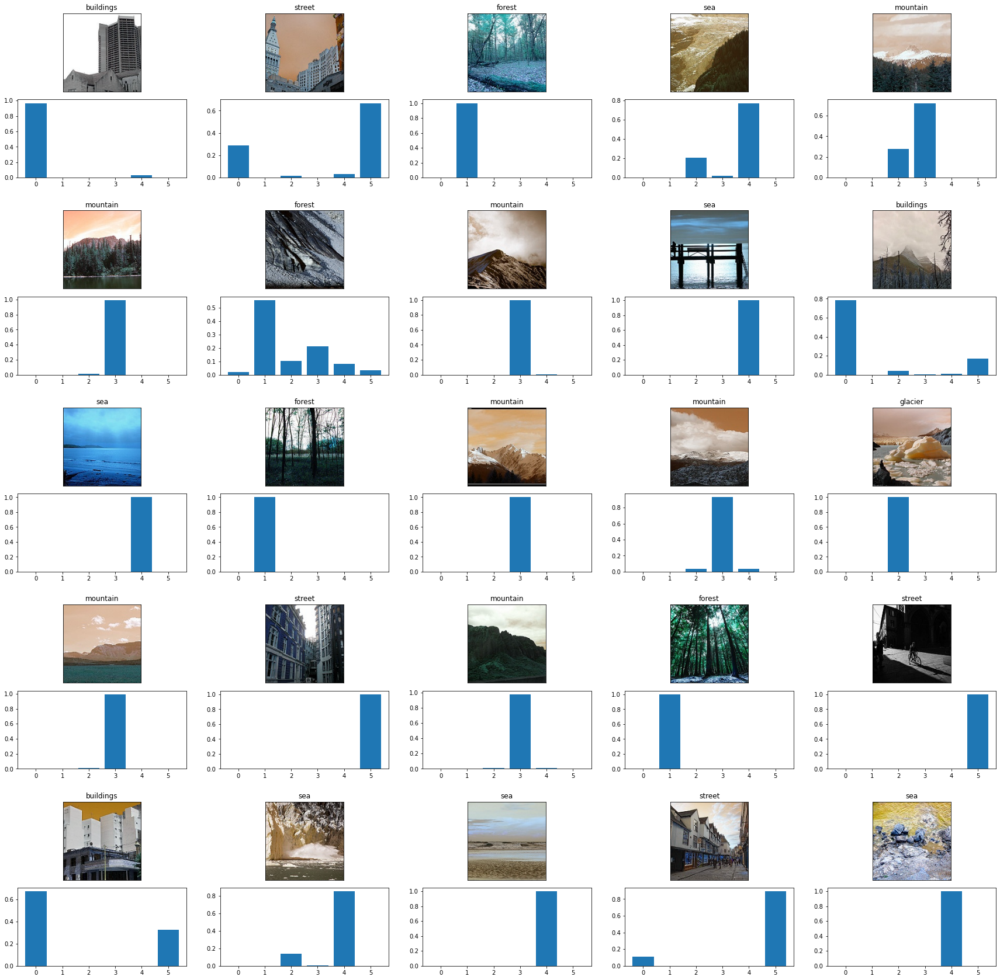

In [179]:
fig = plot.figure(figsize=(30, 30))
outer = gridspec.GridSpec(5, 5, wspace=0.2, hspace=0.2)

for i in range(25):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,subplot_spec=outer[i], wspace=0.1, hspace=0.1)
    rnd_number = randint(0,len(pred_images))
    pred_image = np.array([pred_images[rnd_number]])
    pred_class = get_classlabel(model.predict_classes(pred_image)[0])
    pred_prob = model.predict(pred_image).reshape(6)
    for j in range(2):
        if (j%2) == 0:
            ax = plot.Subplot(fig, inner[j])
            ax.imshow(pred_image[0])
            ax.set_title(pred_class)
            ax.set_xticks([])
            ax.set_yticks([])
            fig.add_subplot(ax)
        else:
            ax = plot.Subplot(fig, inner[j])
            ax.bar([0,1,2,3,4,5],pred_prob)
            fig.add_subplot(ax)


fig.show()

### The plot of the prediction set shows the model performing quite well, so let's make the same plot as above for the test set and include the actual labels along with the predicted labels

<ipython-input-181-b224895bfd1d>:27: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


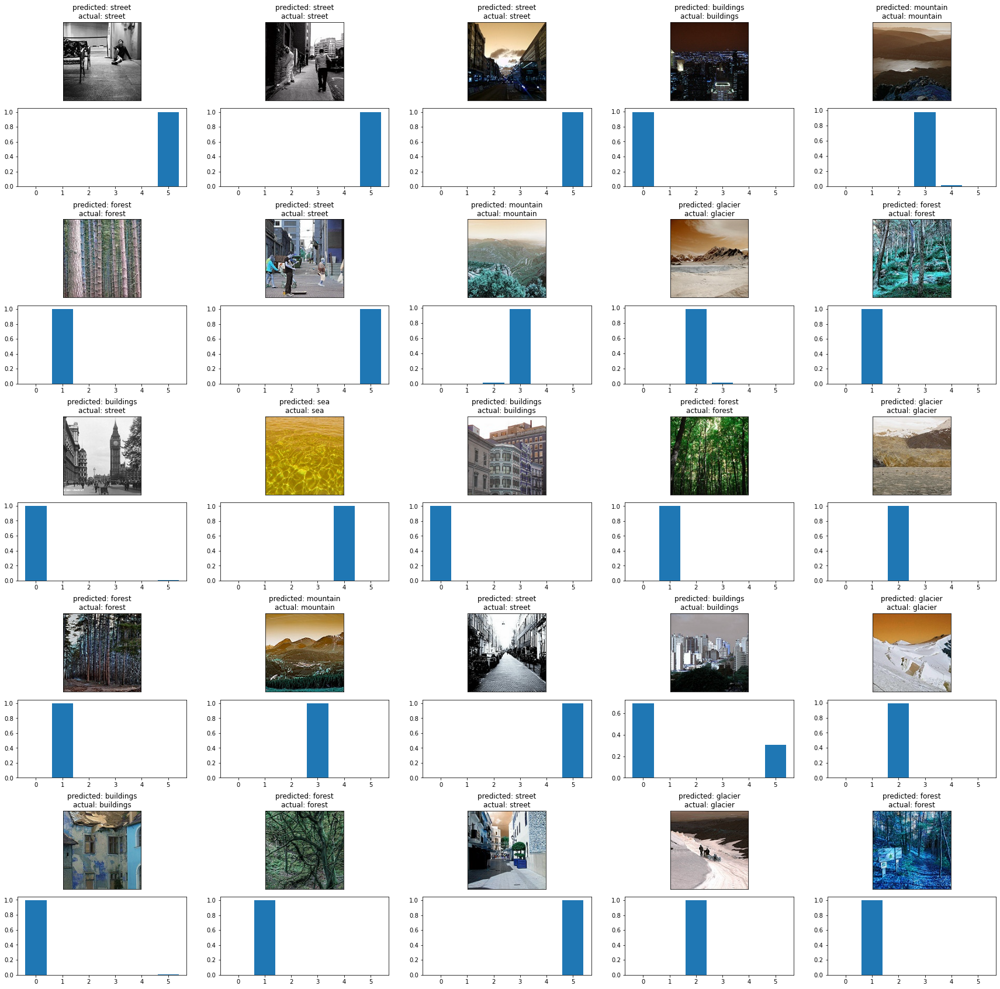

In [181]:
fig = plot.figure(figsize=(30, 30))
outer = gridspec.GridSpec(5, 5, wspace=0.2, hspace=0.2)

for i in range(25):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,subplot_spec=outer[i], wspace=0.1, hspace=0.1)
    
    test_image = np.array([test_images[i]])
    #test_class = get_classlabel(model.predict_classes(test_image)[0]) + ' ' + get_classlabel(test_labels[i])
    test_class_pred = model.predict_classes(test_image)[0]
    test_class = 'predicted: ' + get_classlabel(test_class_pred) + '\n' + 'actual: ' + get_classlabel(test_labels[i])

    test_prob = model.predict(test_image).reshape(6)
    for j in range(2):
        if (j%2) == 0:
            ax = plot.Subplot(fig, inner[j])
            ax.imshow(test_image[0])
            ax.set_title(test_class)
            ax.set_xticks([])
            ax.set_yticks([])
            fig.add_subplot(ax)
        else:
            ax = plot.Subplot(fig, inner[j])
            ax.bar([0,1,2,3,4,5],test_prob)
            fig.add_subplot(ax)


fig.show()

### This figure suggests that model is doing much better than model.evaluate suggests, so let's use that model.predict_classes function instead to calculate the accuracy of the model on the test set

In [63]:
test_label_preds = []
correct_preds = []
for i in range(len(test_images)):
    if(i%100==0):
        print(i)
    test_image = np.array([test_images[i]])
    test_class_pred = model.predict_classes(test_image)[0]
    test_class_act = test_labels[i]
    
    test_label_preds.append(test_class_pred)
    if(test_class_pred==test_class_act):
        correct_preds.append(1)
    else:
        correct_preds.append(0)
            

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900


In [64]:
print('accuracy', np.mean(correct_preds))

accuracy 0.829


### This matches much more closely with the accuracy reported in the training step from the validation set

# Now let's use some of what we learned here and apply it to a new dataset, the google image search dataset. This dataset results from google image searches of the terms architecture, art and culture, food and drinks, and travel and adventure. We will start with a pretrained model and then feed in our image data for a "transfer learning" approach.

### The dataset come from https://www.kaggle.com/duttadebadri/image-classification

### We start with function to read and label the data, very similar to above

In [143]:
def get_google_images(directory):
    Images = []
    Labels = []  # 0 for Building , 1 for forest, 2 for glacier, 3 for mountain, 4 for Sea , 5 for Street
    label = 0
    
    print(os.listdir(directory))
    
    for labels in os.listdir(directory): #Main Directory where each class label is present as folder name.
        if labels == 'architecture':
            label = 0
        elif labels == 'art and culture':
            label = 1
        elif labels == 'food':
            label = 2
        elif labels == 'travel and adventure':
            label = 3
        
        
        for image_file in os.listdir(directory+labels): #Extracting the file name of the image from Class Label folder
            try:
                image = cv2.imread(directory+labels+r'/'+image_file) #Reading the image (OpenCV)
                image = cv2.resize(image,(150,150)) #Resize the image, Some images are different sizes. (Resizing is very Important)
                Images.append(image)
                Labels.append(label)
            except:
                print('error on ', image_file)
            
    
    return shuffle(Images,Labels,random_state=817328462) #Shuffle the dataset you just prepared.

def get_google_classlabel(class_code):
    labels = {0:'architecture', 1:'art', 2:'food', 3:'travel'}
    
    return labels[class_code]

### The openCV library had trouble resizing a few dozen of the images, but since we have tens of thousands of images, we can afford to drop them

In [144]:
Images, Labels = get_google_images('google_scrape/images/images/') #Extract the training images from the folders.

Images = np.array(Images) #converting the list of images to numpy array.
Labels = np.array(Labels)

['travel and adventure', 'art and culture', 'architecture', 'food']
error on  371 (6).jpg
error on  637 (2).jpg
error on  98 (5).jpg
error on  370 (7).jpg
error on  395 (6).jpg
error on  316 (5).jpg
error on  834.jpg
error on  320 (5).jpg
error on  325 (6).jpg
error on  440 (5).jpg
error on  81 (5).jpg
error on  59 (2).jpg
error on  570 (7).jpg
error on  580 (5).jpg
error on  90 (5).jpg
error on  608 (3).jpg
error on  218 (6).jpg
error on  504 (5).jpg
error on  266 (2).jpg
error on  577 (4).jpg
error on  155 (3).jpg
error on  156 (5).jpg
error on  315 (5).jpg
error on  482 (3).jpg
error on  626 (4).jpg
error on  349 (5).jpg
error on  358 (4).jpg
error on  431 (4).jpg
error on  448.jpg
error on  266.jpg
error on  366 (9).jpg
error on  184 (7).jpg
error on  451.jpg
error on  545 (8).jpg
error on  485 (5).jpg
error on  412 (4).jpg
error on  51 (6).jpg
error on  497 (2).jpg
error on  551 (6).jpg
error on  188 (5).jpg
error on  370 (2).jpg
error on  508 (5).jpg
error on  368 (3).jpg
error o

In [145]:
print("Shape of Images:",Images.shape)
print("Shape of Labels:",Labels.shape)

Shape of Images: (35036, 150, 150, 3)
Shape of Labels: (35036,)


In [146]:
set(Labels)

{0, 1, 2, 3}

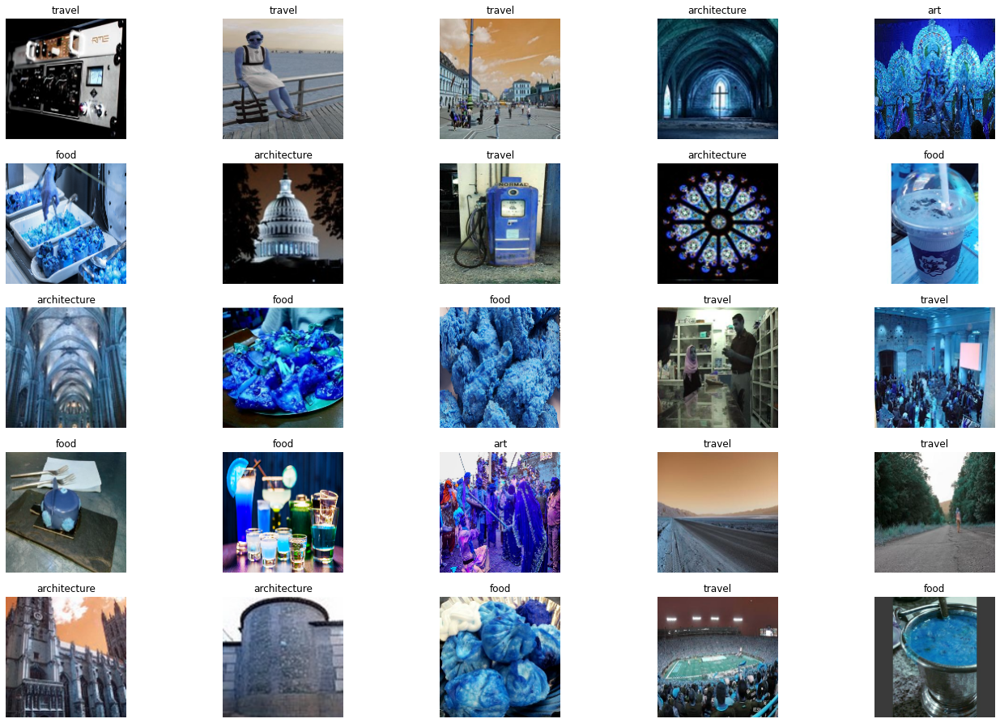

In [147]:
f,ax = plot.subplots(5,5) 
f.subplots_adjust(0,0,3,3)
for i in range(0,5,1):
    for j in range(0,5,1):
        rnd_number = randint(0,len(Images))
        ax[i,j].imshow(Images[rnd_number])
        ax[i,j].set_title(get_google_classlabel(Labels[rnd_number]))
        ax[i,j].axis('off')

In [148]:
test_images,test_labels = get_google_images('google_scrape/validation/validation/')
test_images = np.array(test_images)
test_labels = np.array(test_labels)

['travel and adventure', 'art and culture', 'architecture', 'food']
error on  20.jpg


In [149]:
print("Shape of Images:",test_images.shape)
print("Shape of Labels:",test_labels.shape)

Shape of Images: (121, 150, 150, 3)
Shape of Labels: (121,)


In [150]:
test_labels

array([3, 1, 3, 1, 2, 0, 0, 3, 1, 0, 2, 1, 1, 1, 0, 1, 0, 3, 1, 0, 3, 0,
       3, 3, 3, 2, 1, 2, 0, 3, 1, 1, 1, 1, 0, 0, 2, 3, 2, 3, 0, 0, 0, 2,
       2, 2, 3, 2, 3, 3, 1, 2, 1, 2, 0, 2, 1, 0, 2, 1, 1, 0, 3, 0, 0, 2,
       2, 1, 0, 0, 3, 2, 0, 0, 2, 1, 3, 2, 0, 1, 0, 0, 3, 1, 1, 1, 2, 1,
       2, 3, 2, 0, 3, 1, 0, 0, 1, 3, 2, 2, 0, 2, 0, 0, 3, 1, 1, 3, 0, 3,
       0, 0, 2, 0, 0, 1, 2, 2, 2, 0, 2])

### Here we load the InceptionV3 with inbuilt pretrained weights by the Imagenet, and a few extra layers for us to train with our image data. Using this transfer learning method, the model only takes about 15 minutes to train on my macbook pro, which is reasonable

In [151]:
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.optimizers import RMSprop

# local_weights_file = '/kaggle/input/inceptionv3/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'
pre_trained_model = InceptionV3(input_shape = (150, 150, 3), 
                                include_top = False, 
                                weights = "imagenet")

# pre_trained_model.load_weights(local_weights_file)

for layer in pre_trained_model.layers:
     layer.trainable = False
        
# pre_trained_model.summary()
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

x = layers.Flatten()(last_output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.2)(x)                  
x = layers.Dense(4, activation='softmax')(x)           

model = Model(pre_trained_model.input, x) 

model.compile(optimizer = RMSprop(lr=0.0001), 
              loss = 'sparse_categorical_crossentropy', 
              metrics = ['acc'])

history=model.fit(Images,Labels,epochs=1,validation_data=(test_images,test_labels))

last layer output shape:  (None, 7, 7, 768)
1095/1095 [==============================] - 1213s 1s/step - loss: 5.0751 - acc: 0.4843 - val_loss: 1.3346 - val_acc: 0.4628


### Here, instead of spliting off a validation set from the training data, we feed the test data in the fitting step as validation data. We test below using the model.predict function to double check its accuracy, and they do in fact match.

In [152]:
test_label_preds = []
correct_preds = []
for i in range(len(test_images)):
    if(i%100==0):
        print(i)
    test_image = np.array([test_images[i]])
    test_class_pred = np.argmax(model.predict(test_image),axis=1)[0]
    test_class_act = test_labels[i]
    
    test_label_preds.append(test_class_pred)
    if(test_class_pred==test_class_act):
        correct_preds.append(1)
    else:
        correct_preds.append(0)

0
100


In [153]:
print('accuracy', np.mean(correct_preds))

accuracy 0.4628099173553719


### The accuracy isn't great, but it's certainly better than random guessing. And we expected this, as the classes aren't that well defined. But to get a better idea of how the model is "thinking" let's look more closely at some examples and their predicted and actual labels

<ipython-input-173-dd54976a49e5>:27: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


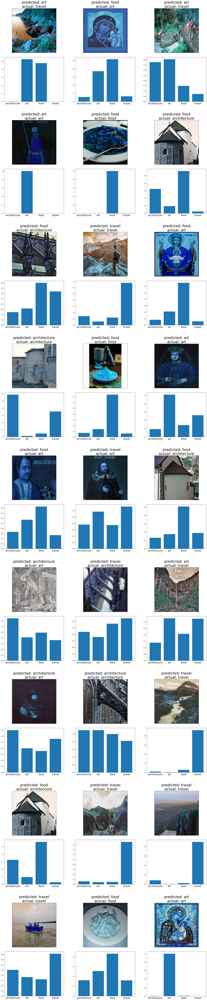

In [173]:
fig = plot.figure(figsize=(30, 150))
outer = gridspec.GridSpec(9, 3, wspace=0.2, hspace=0.2)

for i in range(27):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,subplot_spec=outer[i], wspace=0.1, hspace=0.1)
    
    test_image = np.array([test_images[i]])
    test_class_pred = np.argmax(model.predict(test_image),axis=1)[0]
    test_class = 'predicted: ' + get_google_classlabel(test_class_pred) + '\n' + 'actual: ' + get_google_classlabel(test_labels[i])
    test_prob = model.predict(test_image).reshape(4)
    for j in range(2):
        if (j%2) == 0:
            ax = plot.Subplot(fig, inner[j])
            ax.imshow(test_image[0])
            ax.set_title(test_class, fontsize=30)
            ax.set_xticks([])
            ax.set_yticks([])
            fig.add_subplot(ax)
        else:
            ax = plot.Subplot(fig, inner[j])
            ax.bar([0,1,2,3],test_prob)
            fig.add_subplot(ax)
            ax.set_xticks(np.arange(4))
            ax.set_xticklabels(['architecture', 'art', 'food', 'travel'], fontsize=20)


fig.show()